# 3. Model Building and Training

In this stage we will be performing model training and all the task that will be needed to build a model.

Following task will be done in this notebook:
1. Getting the dataset.
2. Preparing the dataset for the model.
3. Training the model.

In [1]:
import os
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sktime.split import temporal_train_test_split
from sktime.forecasting.naive import NaiveForecaster
from sktime.performance_metrics.forecasting import mean_squared_percentage_error, mean_absolute_percentage_error
from sktime.utils.plotting import plot_series
from sktime.forecasting.compose import make_reduction, ForecastingPipeline
from sktime.transformations.series.summarize import WindowSummarizer
from sktime.transformations.series.date import DateTimeFeatures

import lightgbm as lgb
import optuna

## 1. Getting the Dataset

In [2]:
# Changing the working directory to project directory
NOTEBOOK_DIR_PATH = Path('D:/projects/energy-consumption-forecasting/notebooks')

if Path(os.getcwd()) == NOTEBOOK_DIR_PATH:
    os.chdir(path='..')

os.getcwd()

'd:\\projects\\energy-consumption-forecasting'

In [3]:
# Getting the raw data directory and all the files in it
RAW_DATA_DIR = Path('data/processed_data/')

file_list = list(RAW_DATA_DIR.iterdir())
file_list

[WindowsPath('data/processed_data/denmark_energy_consumption_view_v1_metadata.json'),
 WindowsPath('data/processed_data/dk_energy_consumption_v1_2021-01-01T00-00-00_2023-12-31T23-00-00.csv'),
 WindowsPath('data/processed_data/dk_energy_consumption_v1_metadata.json')]

In [4]:
dataset_filepath = 'data/processed_data/dk_energy_consumption_v1_2021-01-01T00-00-00_2023-12-31T23-00-00.csv'

# Reading the dataset
dataset_df = pd.read_csv(dataset_filepath,
                         dtype={'municipality_num': 'int32',
                                'branch': 'int8',
                                'consumption_kwh': 'float64'})
dataset_df['datetime_dk'] = pd.to_datetime(dataset_df['datetime_dk'])
dataset_df.head()

,datetime_dk,municipality_num,branch,consumption_kwh
0,2021-01-01,860,3,19864.474
1,2021-01-01,860,1,2237.222
2,2021-01-01,860,2,23567.818
3,2021-01-01,851,3,37842.849
4,2021-01-01,851,1,10517.319


In [5]:
dataset_df.shape

(7705152, 4)

In [6]:
dataset_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7705152 entries, 0 to 7705151
Data columns (total 4 columns):
 #   Column            Dtype         
---  ------            -----         
 0   datetime_dk       datetime64[ns]
 1   municipality_num  int32         
 2   branch            int8          
 3   consumption_kwh   float64       
dtypes: datetime64[ns](1), float64(1), int32(1), int8(1)
memory usage: 154.3 MB


There are total 98 municipality and 3 branch in the dataset.

We will get a quick visualization of the dataset for each branch and their respective municipality.

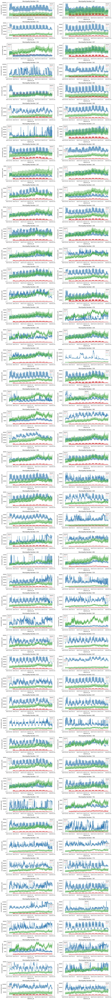

In [7]:
# Getting the list of municipality numbers
municipality_num_list = sorted(dataset_df.municipality_num.unique())

# Visualizing all the municipality between Oct 23 and Dec 23 
plt.figure(figsize=(15, 132))
for i, num in enumerate(municipality_num_list, start=1):
    plt.subplot(len(municipality_num_list) // 2, 2, i)
    sns.lineplot(data=dataset_df[(dataset_df['municipality_num'] == num) \
                                 & (dataset_df['datetime_dk'] > '2023-10-01') \
                                 & (dataset_df['datetime_dk'] < '2024-01-01')].reset_index(drop=True),
                 x='datetime_dk',
                 y='consumption_kwh',
                 hue='branch',
                 palette='Set1')
    plt.title(f'Municipality Number: {num}')

plt.tight_layout();

## 2. Preparing the Dataset.

Dataset needs to prepared as per the sktime method for hierarchial time-series dataset.

* All the data for training needs to be in index format
* The datetime feature needs to be in period format.

Note: The dataset datetime feature needs to be in Hourly base period.

In [8]:
# Selecting a subset from the dataset
dataset_df = dataset_df[(dataset_df['datetime_dk'] >= '2023-01-01') \
                        & (dataset_df['datetime_dk'] < '2024-01-01')].reset_index(drop=True)

dataset_df.drop_duplicates(subset=['municipality_num', 'branch', 'datetime_dk'], ignore_index=True, inplace=True)

dataset_df.head()

,datetime_dk,municipality_num,branch,consumption_kwh
0,2023-01-01,860,3,15804.367
1,2023-01-01,860,1,2743.408
2,2023-01-01,860,2,25819.556
3,2023-01-01,851,3,30881.813
4,2023-01-01,851,1,9825.927


In [9]:
dataset_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2553978 entries, 0 to 2553977
Data columns (total 4 columns):
 #   Column            Dtype         
---  ------            -----         
 0   datetime_dk       datetime64[ns]
 1   municipality_num  int32         
 2   branch            int8          
 3   consumption_kwh   float64       
dtypes: datetime64[ns](1), float64(1), int32(1), int8(1)
memory usage: 51.1 MB


In [10]:
# Indexing all the training features and converting the datetime into period format
dataset_df['datetime_dk'] = pd.PeriodIndex(dataset_df['datetime_dk'],
                                           freq='H')
dataset_df = dataset_df.set_index(['municipality_num', 
                                   'branch', 
                                   'datetime_dk']).sort_index()

dataset_df.head()

consumption_kwh
municipality_num branch datetime_dk                      
101              1      2023-01-01 00:00        26307.196
                        2023-01-01 01:00        26054.986
                        2023-01-01 02:00        25788.174
                        2023-01-01 03:00        25624.781
                        2023-01-01 04:00        25625.948

In [11]:
dataset_df.index[0], dataset_df.index[-1] 

((101, 1, Period('2023-01-01 00:00', 'H')),
 (860, 3, Period('2023-12-31 23:00', 'H')))

In [12]:
# Splitting the training and target features
X = dataset_df.drop(columns=['consumption_kwh'])
y = dataset_df[['consumption_kwh']]

In [13]:
X.head()

Empty DataFrame
Columns: []
Index: [(101, 1, 2023-01-01 00:00), (101, 1, 2023-01-01 01:00), (101, 1, 2023-01-01 02:00), (101, 1, 2023-01-01 03:00), (101, 1, 2023-01-01 04:00)]

In [14]:
y.head()

consumption_kwh
municipality_num branch datetime_dk                      
101              1      2023-01-01 00:00        26307.196
                        2023-01-01 01:00        26054.986
                        2023-01-01 02:00        25788.174
                        2023-01-01 03:00        25624.781
                        2023-01-01 04:00        25625.948

In [15]:
X.shape, y.shape

((2553978, 0), (2553978, 1))

In [16]:
# Creating a train and test set
FORECAST_HORIZON = 360
y_train, y_test, X_train, X_test = temporal_train_test_split(y=y.sort_index(),
                                                             X=X.sort_index(),
                                                             test_size=FORECAST_HORIZON)

In [17]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((2448138, 0), (2448138, 1), (105840, 0), (105840, 1))

## 3. Training the model.

### Baseline Model

In [18]:
baseline_model = NaiveForecaster(sp=24)
baseline_model.fit(y=y_train, X=X_train, fh=np.arange(FORECAST_HORIZON)+1)

NaiveForecaster(sp=24)

In [19]:
y_pred = baseline_model.predict(X=X_test)

In [20]:
y_pred.head()

consumption_kwh
municipality_num branch datetime_dk                      
101              1      2023-12-17 00:00        30081.375
                        2023-12-17 01:00        29381.799
                        2023-12-17 02:00        28947.756
                        2023-12-17 03:00        28667.649
                        2023-12-17 04:00        28421.274

In [21]:
y_pred.tail()

consumption_kwh
municipality_num branch datetime_dk                      
860              3      2023-12-31 19:00        20992.678
                        2023-12-31 20:00        19307.585
                        2023-12-31 21:00        18012.273
                        2023-12-31 22:00        16885.551
                        2023-12-31 23:00        15307.459

In [22]:
baseline_mape = mean_absolute_percentage_error(y_true=y_test, y_pred=y_pred, symmetric=False)
baseline_mape

0.14126429631647816

In [23]:
baseline_rmspe = mean_squared_percentage_error(y_true=y_test, y_pred=y_pred, square_root=True)
baseline_rmspe

0.24277666404275924

In [24]:
def model_evaluate(forecast_model,
                   X_test,
                   y_test):
    
    y_pred = forecast_model.predict(X=X_test)

    result_dict = {}
    mape = mean_absolute_percentage_error(y_true=y_test, y_pred=y_pred, symmetric=False)
    rmspe = mean_squared_percentage_error(y_true=y_test, y_pred=y_pred, square_root=True)
    result_dict['mape'] = mape
    result_dict['rmspe'] = rmspe

    # Grouping the data and evaluating for every branch in the hierarchy
    grouped_result_df = pd.DataFrame(columns=['municipality_num', 'branch', 'mape', 'rmspe'])
    y_test_group = y_test.groupby(['municipality_num', 'branch'])
    y_pred_group = y_pred.groupby(['municipality_num', 'branch'])

    for y_test_group, y_pred_group in zip(y_test_group, y_pred_group):
        (y_test_m_num, y_test_branch), y_test_data = y_test_group
        (y_pred_m_num, y_pred_branch), y_pred_data = y_pred_group

        # Performing quantitative performance metric on every branched data
        mape_group = mean_absolute_percentage_error(y_true=y_test_data, 
                                                    y_pred=y_pred_data, 
                                                    symmetric=False)
        rmspe_group = mean_squared_percentage_error(y_true=y_test_data, 
                                                    y_pred=y_pred_data, 
                                                    square_root=True)
        
        group_df = pd.DataFrame({'municipality_num': [y_test_m_num],
                                 'branch': [y_test_branch],
                                 'mape': [mape_group],
                                 'rmspe': [rmspe_group],})
        grouped_result_df = pd.concat([grouped_result_df, group_df], ignore_index=True)

    result_dict['grouped_result_df'] = grouped_result_df
    
    return result_dict, y_pred


In [25]:
baseline_result_dict, baseline_pred_df = model_evaluate(baseline_model,
                                                        X_test,
                                                        y_test)
baseline_result_dict

{'mape': 0.14126429631647816,
 'rmspe': 0.24277666404275924,
 'grouped_result_df':     municipality_num branch      mape     rmspe
 0                101      1  0.102292  0.151128
 1                101      2  0.104053  0.130673
 2                101      3  0.102739  0.135711
 3                147      1  0.109424  0.153665
 4                147      2  0.137976  0.180952
 ..               ...    ...       ...       ...
 289              851      2  0.150587  0.186399
 290              851      3  0.087908  0.116868
 291              860      1  0.085743  0.140162
 292              860      2  0.165010  0.195020
 293              860      3  0.119163  0.142580
 
 [294 rows x 4 columns]}

In [26]:
baseline_pred_df

consumption_kwh
municipality_num branch datetime_dk                      
101              1      2023-12-17 00:00        30081.375
                        2023-12-17 01:00        29381.799
                        2023-12-17 02:00        28947.756
                        2023-12-17 03:00        28667.649
                        2023-12-17 04:00        28421.274
...                                                   ...
860              3      2023-12-31 19:00        20992.678
                        2023-12-31 20:00        19307.585
                        2023-12-31 21:00        18012.273
                        2023-12-31 22:00        16885.551
                        2023-12-31 23:00        15307.459

[105840 rows x 1 columns]

In [27]:
baseline_result_dict.get('grouped_result_df')

,municipality_num,branch,mape,rmspe
0,101,1,0.102292,0.151128
1,101,2,0.104053,0.130673
2,101,3,0.102739,0.135711
3,147,1,0.109424,0.153665
4,147,2,0.137976,0.180952
...,...,...,...,...
289,851,2,0.150587,0.186399
290,851,3,0.087908,0.116868
291,860,1,0.085743,0.140162
292,860,2,0.165010,0.195020


In [28]:
def plot_evaluation_result(y_test_df,
                           y_pred_df,
                           result_dict,
                           model_name):
    
    save_dirpath = Path(f'./data/asset/training/{model_name}')
    if not save_dirpath.exists():
        os.makedirs(save_dirpath)

    # Plotting actual and prediction results and saving the plot
    y_test_df = y_test_df.reset_index(level=[0, 1]).groupby(['municipality_num', 'branch'])
    y_pred_df = y_pred_df.reset_index(level=[0, 1]).groupby(['municipality_num', 'branch'])

    for y_test, y_pred in zip(y_test_df, y_pred_df):
        (y_test_m_num, y_test_branch), y_test_data = y_test
        (y_pred_m_num, y_pred_branch), y_pred_data = y_pred

        fig, axs = plot_series(y_test_data.consumption_kwh, 
                               y_pred_data.consumption_kwh,
                               labels=['Actual - y_test',
                                       'Prediction - y_pred'],
                               markers=["", ""])
        
        fig.suptitle(f'Municipality Num: {y_test_m_num} - Branch: {y_test_branch}\n')
        prediction_filepath = save_dirpath / f'pred_result_{y_test_m_num}_{y_test_branch}.png'
        plt.savefig(prediction_filepath)
        plt.close(fig)
    print(f'All the plots of actual and prediction comparison has been saved to "{save_dirpath}"')

    # Plotting and saving performance metrics result
    data = result_dict.get('grouped_result_df')
    
    fig, axs = plt.subplots(2, 1,  figsize=(25, 25))
    fig.suptitle(t='Quantitative Performance Metrics: MAPE and RMSPE\n\n',
                 weight='bold', 
                 size=25)
    
    for i, metrics in enumerate(['mape', 'rmspe']):
        sns.barplot(data=data,
                    x='municipality_num',
                    y=metrics,
                    hue='branch',
                    palette='Set1',
                    ax=axs[i])
        axs[i].set_xticks(axs[i].get_xticks())
        axs[i].set_xticklabels(data.municipality_num.unique(), 
                               rotation=90, 
                               size=12)
        axs[i].tick_params(axis='y', labelsize=12)
        axs[i].set_xlabel('Municipality Number\n', size=20)
        axs[i].set_ylabel(f'{metrics.upper()}', size=20)
        axs[i].legend(title='Branch', 
                      title_fontsize=15, 
                      fontsize=12,)
    plt.tight_layout()

    metrics_filepath = save_dirpath / 'metrics_result.png'
    plt.savefig(metrics_filepath)
    plt.close(fig)
    print(f'Quantitative performance metrics is been saved: "{metrics_filepath}"')

In [29]:
plot_evaluation_result(y_test_df=y_test,
                       y_pred_df=baseline_pred_df,
                       result_dict=baseline_result_dict,
                       model_name='baseline_model')

All the plots of actual and prediction comparison has been saved to "data\asset\training\baseline_model"
Quantitative performance metrics is been saved: "data\asset\training\baseline_model\metrics_result.png"


### Advance Model - LightGBM - V1 (No Hyperparameter Tuning)

In [30]:
kwargs = {
    'lag_feature': {
        'lag': list(range(1, 73)),
        'mean': [[1, 24], [1, 48], [1, 72]],
        'std': [[1, 24], [1, 48], [1, 72]]
    }
}
n_jobs = -1
window_summarizer = WindowSummarizer(**kwargs, n_jobs=n_jobs)

lgbm_regressor = lgb.LGBMRegressor()
forecaster = make_reduction(estimator=lgbm_regressor,
                            transformers=[window_summarizer],
                            window_length=None,
                            strategy='recursive',
                            pooling='global')

pipe = ForecastingPipeline(steps=[
    ('daily_season', DateTimeFeatures(manual_selection=['day_of_week', 'hour_of_day'],
                                      keep_original_columns=True)),
    ('forecaster', forecaster),
])

pipe_return = pipe.fit(y=y_train, X=X_train, fh=np.arange(FORECAST_HORIZON)+1)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.322586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19921
[LightGBM] [Info] Number of data points in the train set: 2426970, number of used features: 80
[LightGBM] [Info] Start training from score 12955.529696


In [31]:
lgbm_v1_result_dict, lgbm_v1_y_pred =  model_evaluate(forecast_model=pipe_return,
                                                                X_test=X_test,
                                                                y_test=y_test)

In [32]:
plot_evaluation_result(y_test_df=y_test,
                       y_pred_df=lgbm_v1_y_pred,
                       result_dict=lgbm_v1_result_dict,
                       model_name='lgbm_regressor_v1')

All the plots of actual and prediction comparison has been saved to "data\asset\training\lgbm_regressor_v1"
Quantitative performance metrics is been saved: "data\asset\training\lgbm_regressor_v1\metrics_result.png"


In [33]:
lgbm_v1_result_dict

{'mape': 0.3527618727732564,
 'rmspe': 0.933754456616671,
 'grouped_result_df':     municipality_num branch      mape     rmspe
 0                101      1  0.083494  0.112572
 1                101      2  0.184227  0.224503
 2                101      3  0.349802  0.492133
 3                147      1  0.088929  0.122901
 4                147      2  0.176773  0.224618
 ..               ...    ...       ...       ...
 289              851      2  0.175827  0.236676
 290              851      3  0.209042  0.260723
 291              860      1  0.110837  0.143302
 292              860      2  0.139199  0.165184
 293              860      3  0.133762  0.164624
 
 [294 rows x 4 columns]}

### Advance Model - LightGBM - V2 (Hyperparameter Tuning with Optuna)

In [34]:
def model_tuning(X_train, y_train, X_test, y_test, fh, model):

    kwargs = {
        'lag_feature': {
            'lag': list(range(1, 73)),
            'mean': [[1, 24], [1, 48], [1, 72]],
            'std': [[1, 24], [1, 48], [1, 72]]
        }
    }
    n_jobs = -1
    window_summarizer = WindowSummarizer(**kwargs, n_jobs=n_jobs)

    forecaster = make_reduction(estimator=model,
                                transformers=[window_summarizer],
                                window_length=None,
                                strategy='recursive',
                                pooling='global')

    pipe = ForecastingPipeline(steps=[
        ('daily_season', DateTimeFeatures(manual_selection=['day_of_week', 'hour_of_day'],
                                          keep_original_columns=True)),
        ('forecaster', forecaster),
    ])

    pipe_return = pipe.fit(y=y_train, X=X_train, fh=fh)
    y_pred = pipe_return.predict(X=X_test)
    error = mean_absolute_percentage_error(y_true=y_test, y_pred=y_pred, symmetric=False)
    
    return error

def objective(trial):
    
    lgbm_params = {'learning_rate': trial.suggest_float('learning_rate', 1e-3, 1e-1, log=True),
                   'num_leaves': trial.suggest_int('num_leaves', 2, 256),
                   'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 1, 100),
                   'bagging_fraction': trial.suggest_float('bagging_fraction', 0.1, 1.0),
                   'colsample_bytree': trial.suggest_float('colsample_bytree', 0.1, 1.0),
                   'n_estimators': 500,
                   'bagging_freq': 1,}

    return model_tuning(X_train=X_train,
                         y_train=y_train,
                         X_test=X_test,
                         y_test=y_test,
                         fh=np.arange(FORECAST_HORIZON) + 1,
                         model=lgb.LGBMRegressor(**lgbm_params))

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=2)


[I 2024-03-04 14:49:26,667] A new study created in memory with name: no-name-71e2ddb4-9ba6-46fc-abc6-cfdff1d85482


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] bagging_fraction is set=0.49849590218579465, subsample=1.0 will be ignored. Current value: bagging_fraction=0.49849590218579465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] bagging_fraction is set=0.49849590218579465, subsample=1.0 will be ignored. Current value: bagging_fraction=0.49849590218579465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.327988 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19921
[LightGBM] [Info] Number of data points in th

[I 2024-03-04 15:04:00,075] Trial 0 finished with value: 1.8744486274491852 and parameters: {'learning_rate': 0.007366581748988032, 'num_leaves': 95, 'min_data_in_leaf': 50, 'bagging_fraction': 0.49849590218579465, 'colsample_bytree': 0.9453441641467367}. Best is trial 0 with value: 1.8744486274491852.


[LightGBM] [Warning] min_data_in_leaf is set=14, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=14
[LightGBM] [Warning] bagging_fraction is set=0.9130340529442528, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9130340529442528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=14, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=14
[LightGBM] [Warning] bagging_fraction is set=0.9130340529442528, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9130340529442528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.295240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19921
[LightGBM] [Info] Number of data points in the tr

[I 2024-03-04 15:17:59,708] Trial 1 finished with value: 1.8967459298436709 and parameters: {'learning_rate': 0.007279753427291547, 'num_leaves': 37, 'min_data_in_leaf': 14, 'bagging_fraction': 0.9130340529442528, 'colsample_bytree': 0.8636132500102343}. Best is trial 0 with value: 1.8744486274491852.


In [35]:
# Best parameters with single objective optimization
study.best_params, study.best_value

({'learning_rate': 0.007366581748988032,
  'num_leaves': 95,
  'min_data_in_leaf': 50,
  'bagging_fraction': 0.49849590218579465,
  'colsample_bytree': 0.9453441641467367},
 1.8744486274491852)

In [36]:
# Plotting optuna hyperparameters study 
fig = optuna.visualization.plot_optimization_history(study)
fig.show()

In [37]:
fig = optuna.visualization.plot_slice(study)
fig.show()

In [38]:
# Evaluating using the best parameters with single objective optimization
lgbm_params = {'learning_rate': study.best_params.get('learning_rate'),
               'num_leaves': study.best_params.get('num_leaves'),
               'min_data_in_leaf': study.best_params.get('min_data_in_leaf'),
               'bagging_fraction': study.best_params.get('bagging_fraction'),
               'colsample_bytree': study.best_params.get('colsample_bytree'),
               'n_estimators': 500,
               'bagging_freq': 1,}

lgbm_regressor = lgb.LGBMRegressor(**lgbm_params)

forecaster = make_reduction(estimator=lgbm_regressor,
                            transformers=[window_summarizer],
                            window_length=None,
                            strategy='recursive',
                            pooling='global')

pipe = ForecastingPipeline(steps=[
    ('daily_season', DateTimeFeatures(manual_selection=['day_of_week', 'hour_of_day'],
                                      keep_original_columns=True)),
    ('forecaster', forecaster),
])

pipe_return = pipe.fit(y=y_train, X=X_train, fh=np.arange(FORECAST_HORIZON)+1)

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] bagging_fraction is set=0.49849590218579465, subsample=1.0 will be ignored. Current value: bagging_fraction=0.49849590218579465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] bagging_fraction is set=0.49849590218579465, subsample=1.0 will be ignored. Current value: bagging_fraction=0.49849590218579465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.291113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19921
[LightGBM] [Info] Number of data points in th

In [39]:
lgbm_v2_result_dict, lgbm_v2_y_pred =  model_evaluate(forecast_model=pipe_return,
                                                      X_test=X_test,
                                                      y_test=y_test)

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] bagging_fraction is set=0.49849590218579465, subsample=1.0 will be ignored. Current value: bagging_fraction=0.49849590218579465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] bagging_fraction is set=0.49849590218579465, subsample=1.0 will be ignored. Current value: bagging_fraction=0.49849590218579465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] bagging_fraction is set=0.49849590218579465, subsample=1.0 will be ignored. Current value: bagging_

In [40]:
lgbm_v2_result_dict

{'mape': 1.8744486274491852,
 'rmspe': 5.501720548001555,
 'grouped_result_df':     municipality_num branch      mape     rmspe
 0                101      1  0.257389  0.281651
 1                101      2  0.194680  0.236282
 2                101      3  0.337211  0.393831
 3                147      1  0.718287  0.843044
 4                147      2  0.145319  0.171954
 ..               ...    ...       ...       ...
 289              851      2  0.158541  0.215862
 290              851      3  0.325543  0.375722
 291              860      1  1.110055  1.267961
 292              860      2  0.275385  0.298744
 293              860      3  0.211587  0.250960
 
 [294 rows x 4 columns]}

In [41]:
plot_evaluation_result(y_test_df=y_test,
                       y_pred_df=lgbm_v2_y_pred,
                       result_dict=lgbm_v2_result_dict,
                       model_name='lgbm_regressor_v2')

All the plots of actual and prediction comparison has been saved to "data\asset\training\lgbm_regressor_v2"
Quantitative performance metrics is been saved: "data\asset\training\lgbm_regressor_v2\metrics_result.png"
